# Installing dtws1

In [1]:
!pip uninstall dtws1 -y
!cd .. && make install

Found existing installation: dtws1 0.4.0
Uninstalling dtws1-0.4.0:
  Successfully uninstalled dtws1-0.4.0
rm -fr build/
rm -fr dist/
rm -fr .eggs/
find . -name '*.egg-info' -exec rm -fr {} +
find . -name '*.egg' -exec rm -f {} +
find . -name '*.pyc' -exec rm -f {} +
find . -name '*.pyo' -exec rm -f {} +
find . -name '*~' -exec rm -f {} +
find . -name '__pycache__' -exec rm -fr {} +
rm -fr .tox/
rm -f .coverage
rm -fr htmlcov/
rm -fr .pytest_cache
python setup.py install
running install
running bdist_egg
running egg_info
creating dtws1.egg-info
writing dtws1.egg-info/PKG-INFO
writing dependency_links to dtws1.egg-info/dependency_links.txt
writing requirements to dtws1.egg-info/requires.txt
writing top-level names to dtws1.egg-info/top_level.txt
writing manifest file 'dtws1.egg-info/SOURCES.txt'
reading manifest file 'dtws1.egg-info/SOURCES.txt'
reading manifest template 'MANIFEST.in'
writing manifest file 'dtws1.egg-info/SOURCES.txt'
installing library code to build/bdist.linux-x86_64/e

Best match: setuptools 45.1.0
Processing setuptools-45.1.0-py3.6.egg
setuptools 45.1.0 is already the active version in easy-install.pth
Installing easy_install script to /home/chen/work/venv/bin
Installing easy_install-3.8 script to /home/chen/work/venv/bin

Using /home/chen/work/venv/lib/python3.6/site-packages/setuptools-45.1.0-py3.6.egg
Searching for MarkupSafe==1.1.1
Best match: MarkupSafe 1.1.1
Adding MarkupSafe 1.1.1 to easy-install.pth file

Using /home/chen/work/venv/lib/python3.6/site-packages
Searching for decorator==4.4.1
Best match: decorator 4.4.1
Adding decorator 4.4.1 to easy-install.pth file

Using /home/chen/work/venv/lib/python3.6/site-packages
Finished processing dependencies for dtws1==0.4.0


# Importing Dependencies

In [2]:
from dtws1 import heatmap, colorutil
from PIL import Image
from h3 import h3
import numpy as np
import pandas as pd
import tilemapbase

/home/chen/work/venv/lib/python3.6/site-packages/pyproj/crs/crs.py:53: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  return _prepare_from_string(" ".join(pjargs))
/home/chen/work/venv/lib/python3.6/site-packages/pyproj/crs/crs.py:53: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  return _prepare_from_string(" ".join(pjargs))
/home/chen/work/venv/lib/python3.6/site-packages/pyproj/crs/crs.py:53: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful o

# Initializing Database for Tilemapbase

In [3]:
tilemapbase.init(create=True)

# Initializing Sample Dataframe

In [4]:
hills_lat, hills_lng = 35.66687568, 139.74947495
ids = list(h3.k_ring(h3.geo_to_h3(hills_lat, hills_lng, 10), 10))
print(ids[:3])

['8a2f5aada947fff', '8a2f5aade2b7fff', '8a2f5aade377fff']


In [5]:
lats = [h3.h3_to_geo(i)[0] for i in ids]
lngs = [h3.h3_to_geo(i)[1] for i in ids]
print(lats[0], lngs[0])

35.674231430933254 139.74414398946428


In [6]:
df = pd.DataFrame(dict(
    id = ids,
    lat = lats,
    lng = lngs
))
df["rand"] = np.random.randint(1,15,size=len(df)) ## Random numbers are here to exhibit different colors of grids
df.head()

,id,lat,lng,rand
0,8a2f5aada947fff,35.674231,139.744144,7
1,8a2f5aade2b7fff,35.672726,139.751434,8
2,8a2f5aade377fff,35.666657,139.749727,8
3,8a2f5aad8ceffff,35.664145,139.740854,12
4,8a2f5aad8c9ffff,35.667006,139.744381,2


# Implementing heatmap.draw

# Saving Multiple Images

In [7]:
dfs = []
for i in range(3,15):
    df["rand2"] = df["rand"] % i
    tmp_df = df.copy()
    dfs.append(dict(    
    df=tmp_df, 
    id_col="id",
    val_col="rand2", 
    extent=heatmap.extent(tmp_df["id"]),
    color_selector=colorutil.color_selector(values=tmp_df.rand2, n=max(tmp_df.rand2)) ,
    figsize=(10,10),
    width=1000,
    dpi=50))

# Draw Gif from Images

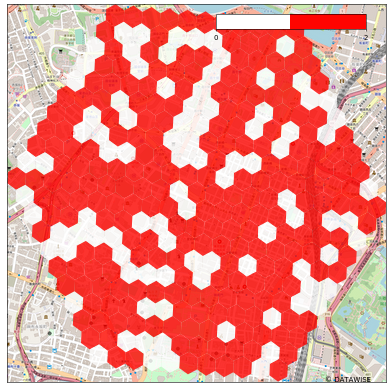

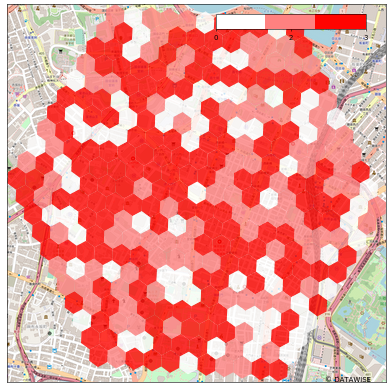

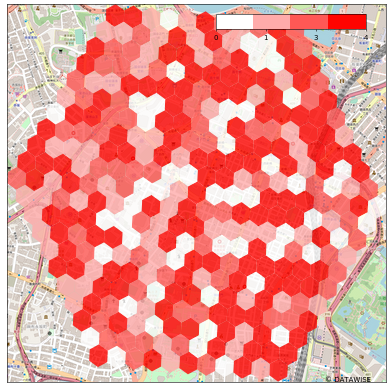

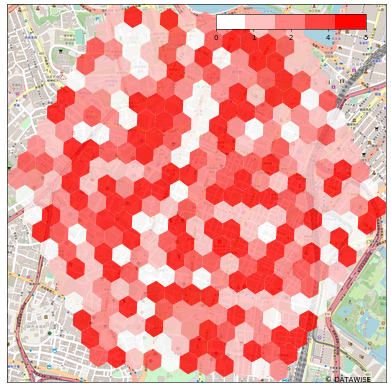

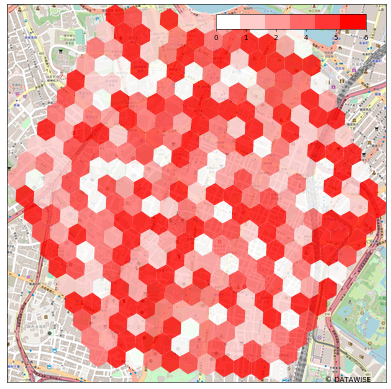

...

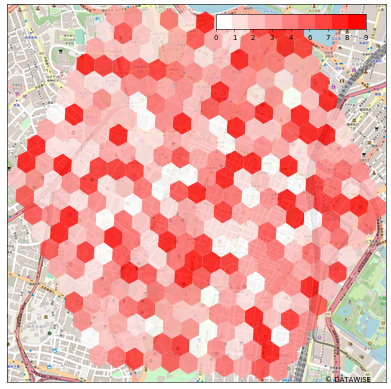

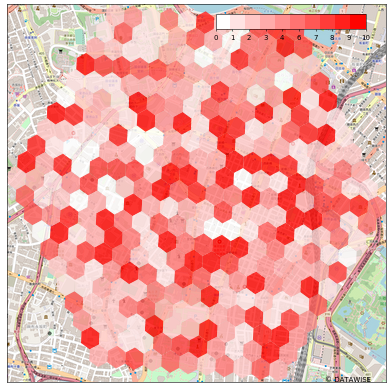

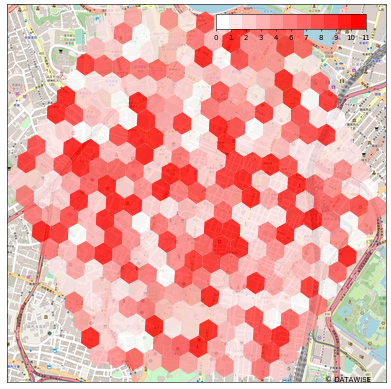

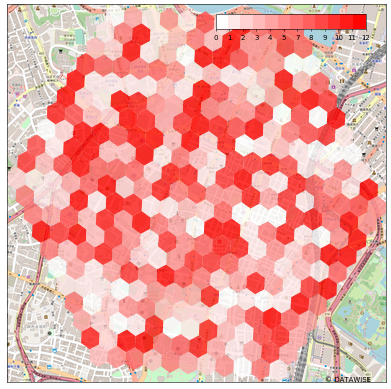

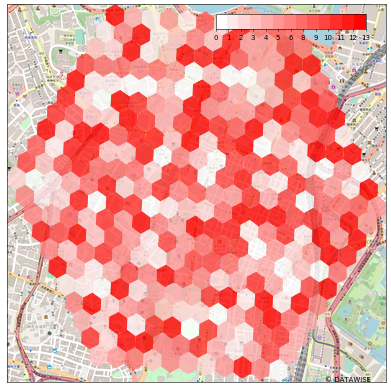

In [8]:

heatmap.draw_gif_from_images(heatmap.draw, dfs, 'images/draw_gif.gif', duration=80, loop=0)


In [9]:
from IPython.display import Image #Jupyter doesn't show GIFs natively
Image(url='./images/draw_gif.gif') 

# Static Colorbar

Simply define a universal colorbar that all of your dataframes share

In [10]:
dfs = []
static_color_selector = colorutil.color_selector(values=df["rand"], n=10) 
for i in range(3,15):
    df["rand2"] = df["rand"] % i
    tmp_df = df.copy()
    dfs.append(dict(    
    df=tmp_df, 
    id_col="id",
    val_col="rand2", 
    extent=heatmap.extent(tmp_df["id"]),
    color_selector= static_color_selector,
    figsize=(10,10),
    width=1000,
    dpi=50))

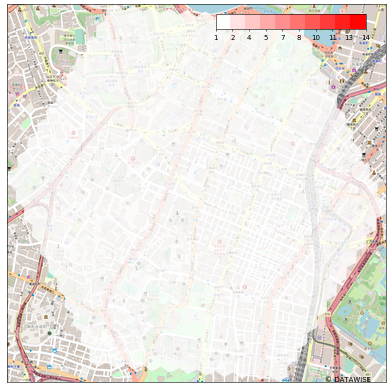

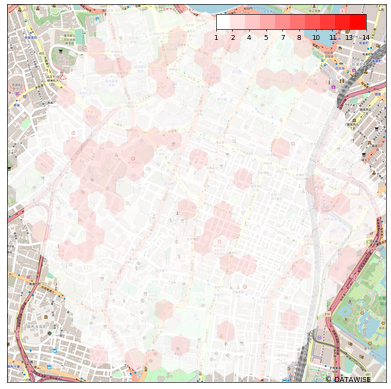

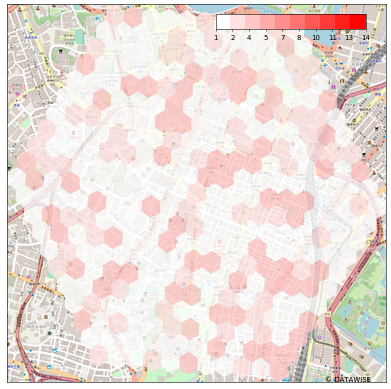

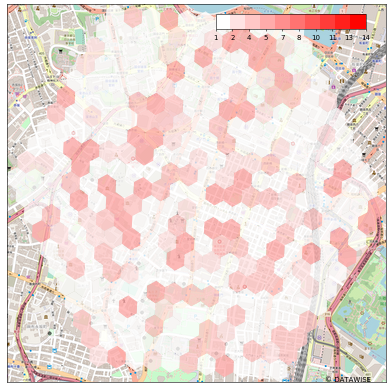

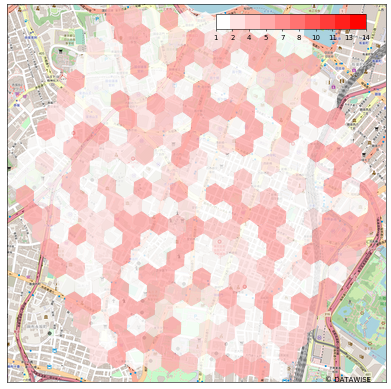

...

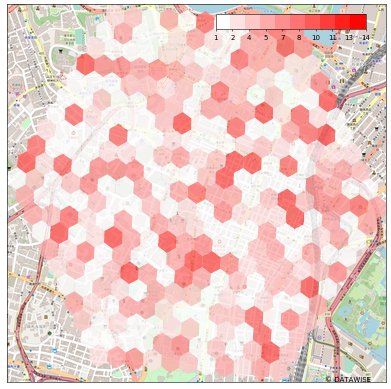

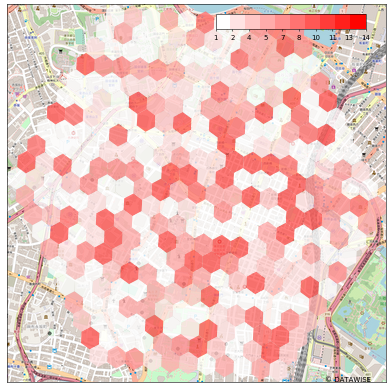

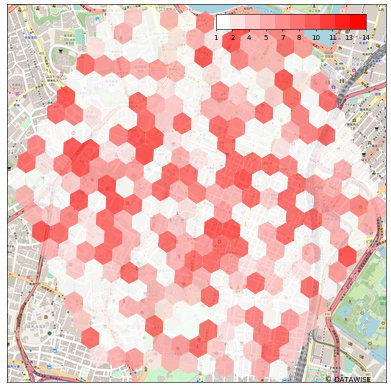

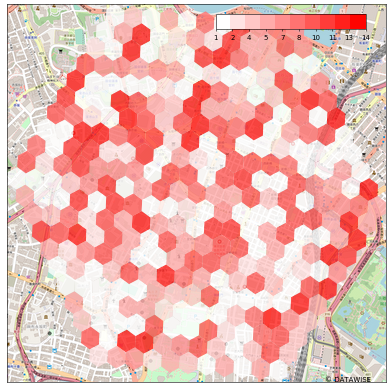

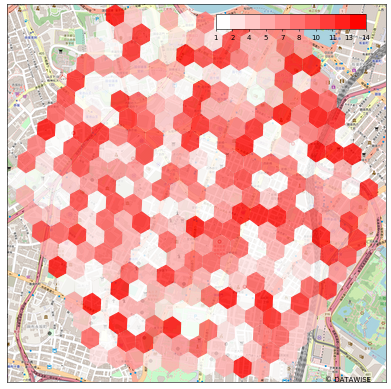

In [11]:
heatmap.draw_gif_from_images(heatmap.draw, dfs, 'images/draw_gif_static_colorbar.gif', duration=80, loop=0)

In [12]:
from IPython.display import Image #Jupyter doesn't show GIFs natively
Image(url='./images/draw_gif_static_colorbar.gif') 

# Using a different color selector

In [13]:
dfs = []
static_color_selector = colorutil.color_selector_tick(ticks=np.arange(0,14)) 
for i in range(3,15):
    df["rand2"] = df["rand"] % i
    tmp_df = df.copy()
    dfs.append(dict(    
    df=tmp_df, 
    id_col="id",
    val_col="rand2", 
    extent=heatmap.extent(tmp_df["id"]),
    color_selector= static_color_selector,
    figsize=(10,10),
    width=1000,
    dpi=50))

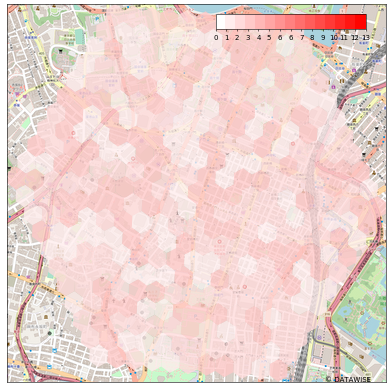

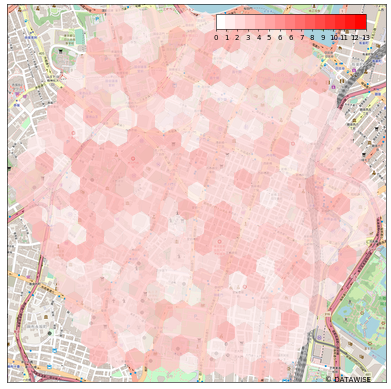

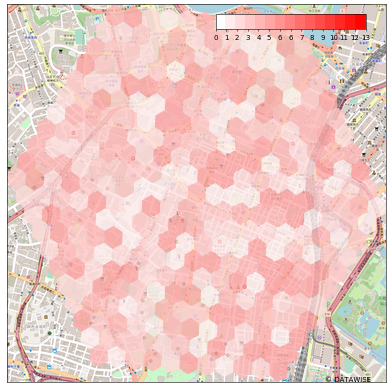

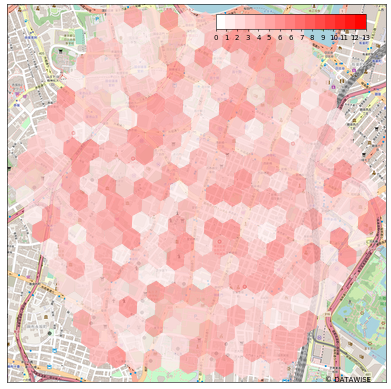

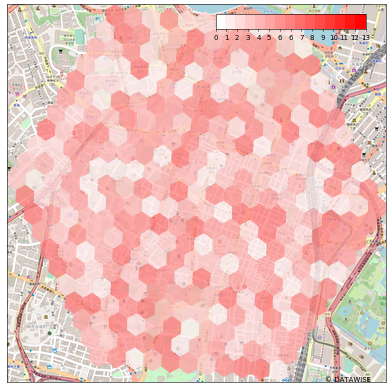

...

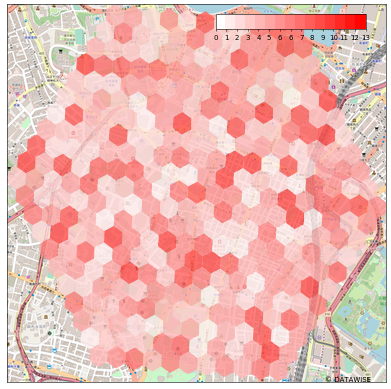

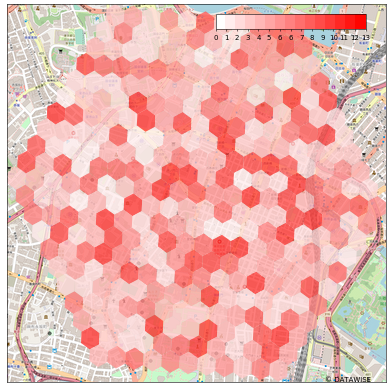

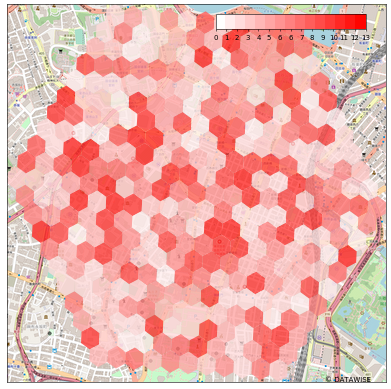

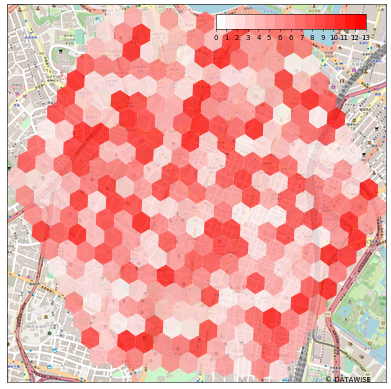

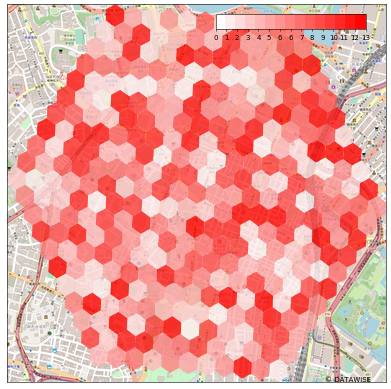

In [14]:
heatmap.draw_gif_from_images(heatmap.draw, dfs, 'images/draw_gif_tick.gif', duration=80, loop=0)

In [15]:
from IPython.display import Image #Jupyter doesn't show GIFs natively
Image(url='./images/draw_gif_tick.gif') 